4 задание (до 4.11 включительно)
* Объединяемся в группы по 1-4 человека, на основании данных, по которым будете сдавать финальный проект
* Собираем данные, делаем первичный анализ, нормируем, удаляем аномалии - это очень важный шаг, пожалуйста уделите ему основную часть времени
* Кластеризуем данные, используя DTW distance
* Кластеризуем данные наиболее подходящим по вашему мнению методом

Формат сдачи задания 4 - общий 

#### Юпитер Ноутбук и аналитическая записка.

In [1]:
!pip install tslearn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
!pip install yfinance

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
!pip install kneed

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [5]:
!pip install statsmodel

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
ERROR: Could not find a version that satisfies the requirement statsmodel (from versions: none)
ERROR: No matching distribution found for statsmodel


In [7]:
from kneed import KneeLocator
import pandas as pd
import numpy as np
import time

import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from tslearn.clustering import TimeSeriesKMeans, silhouette_score
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler, MinMaxScaler
import yfinance as yf
from sklearn.manifold import TSNE, MDS
import warnings
warnings.filterwarnings('ignore', category=UserWarning)

In [8]:
from bs4 import BeautifulSoup
import requests
def get_ticker(offset):
  url=f'https://finance.yahoo.com/crypto/?offset={offset}00&count=100'
  header = {
    'User-Agent': 'Mozilla/5.0 (Macintosh; Intel Mac OS X 10_11_2) AppleWebKit/601.3.9 (KHTML, like Gecko) Version/9.0.2 Safari/601.3.9'
  }
  response=requests.get(url,headers=header)
  soup=BeautifulSoup(response.content, 'lxml')
  ticker=[]
  i=0
  for item in soup.select('.simpTblRow'):
    ticker.insert(i, item.select('[aria-label=Symbol]')[0].get_text())
    i+=1
  return ticker

In [ ]:
curr_list = []
for i in range(0,10):
  curr_list = curr_list+get_ticker(i)

In [ ]:
# df_crypto_m = yf.download(curr_list, interval = "1m", start = '2021-10-01', end = '2022-10-01')['Close']
df_crypto_d = yf.download(curr_list, interval = "1d", start = '2021-10-01', end = '2022-10-01')['Close']


[**********************49%                       ]  486 of 1000 completedGot error from yahoo api for ticker BIFI7311-USD, Error: {'code': 'Not Found', 'description': 'No data found, symbol may be delisted'}
[**********************50%                       ]  502 of 1000 completedGot error from yahoo api for ticker ONG3217-USD, Error: {'code': 'Not Found', 'description': 'No data found, symbol may be delisted'}
[**********************51%                       ]  507 of 1000 completedGot error from yahoo api for ticker WOM19623-USD, Error: {'code': 'Not Found', 'description': 'No data found, symbol may be delisted'}
[**********************51%                       ]  510 of 1000 completedGot error from yahoo api for ticker TTT5514-USD, Error: {'code': 'Not Found', 'description': 'No data found, symbol may be delisted'}
[**********************54%*                      ]  538 of 1000 completedGot error from yahoo api for ticker VINU15270-USD, Error: {'code': 'Not Found', 'description': 'N

Предобработка данных

In [ ]:
tdf_crypto = df_crypto_d.copy()
tdf_crypto.reset_index(inplace=True)
tdf_crypto = tdf_crypto.T
# tdf_crypto.drop(tdf_crypto.index[[0, 1]], inplace = True)
tdf_crypto.dropna(how='any', inplace = True)

Сохраним данные, чтобы не качать лишний раз

In [ ]:
tdf_crypto.to_pickle("tdf_crypto.pkl")

In [9]:
tdf_crypto = pd.read_pickle('tdf_crypto.pkl')

In [13]:
tdf_crypto.shape

(816, 365)

STL декомпозиция временного ряда

In [14]:
from statsmodels.tsa.seasonal import STL

Модель требует, чтобы колонки были в формате дат

In [15]:
tdf_crypto.columns = tdf_crypto.iloc[0]
tdf_crypto = tdf_crypto.drop('Date',axis=0)

In [16]:
scaler = StandardScaler()
tickers_scaled = scaler.fit_transform(tdf_crypto.iloc[:, :].T).T

Получаем временной ряд без сезнности и тренда

In [17]:
tdf_resid = pd.DataFrame(columns=tdf_crypto.columns)
for i in tdf_crypto.index:
  res = STL(tdf_crypto.loc[i]).fit()
  tdf_resid.loc[i] = res.resid

In [18]:
tdf_resid = tdf_resid.reset_index(drop=True)

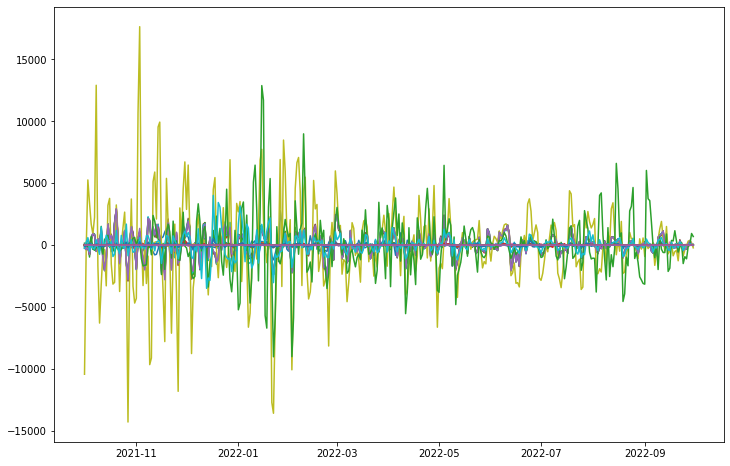

In [19]:
plt.figure(figsize=(12,8))
plt.plot(tdf_resid.T)
plt.show()

In [20]:
tdf_crypto['thold1']=0
for i in tdf_resid.index:
  if max(tdf_resid.iloc[i])>500 or min(tdf_resid.iloc[i])<-500:
    tdf_crypto['thold1'].iloc[i]=-1
  else:
    tdf_crypto['thold1'].iloc[i]=1

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


In [21]:
dfSTL = pd.DataFrame(tickers_scaled)
dfSTL['thold1'] = tdf_crypto['thold1'].to_numpy()

Визуализируем аномальные значения на исходных временных рядах

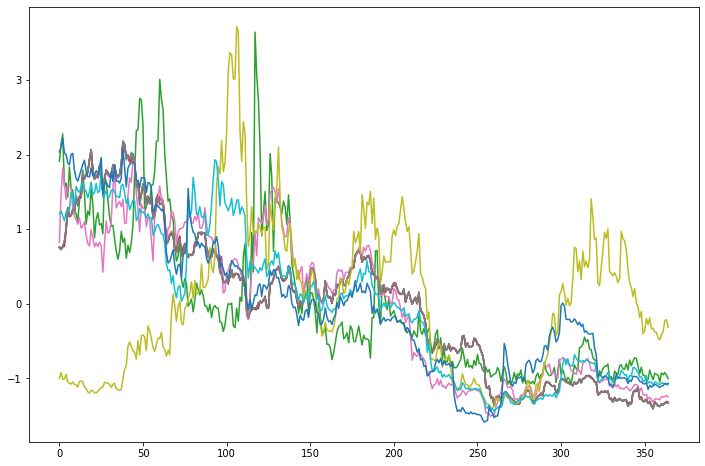

In [22]:
plt.figure(figsize=(12,8))
plt.plot(dfSTL.loc[dfSTL.thold1==-1].drop('thold1',axis=1).T)
plt.show()

Визуализируем не аномальные значения

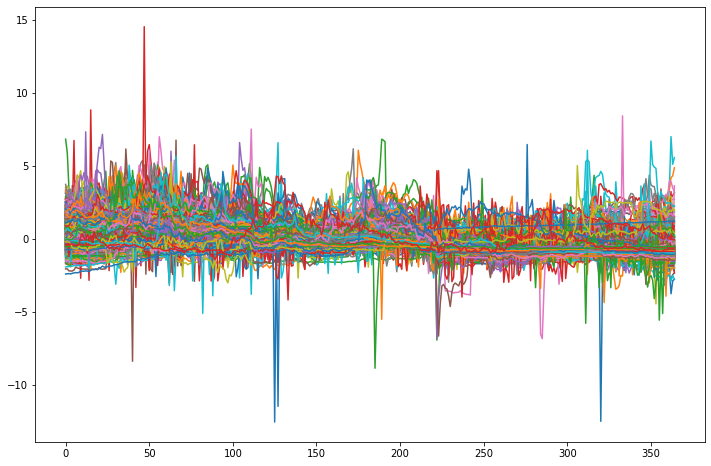

In [23]:
plt.figure(figsize=(12,8))
plt.plot(dfSTL.loc[dfSTL.thold1==1].drop('thold1',axis=1).T)
plt.show()

In [24]:
tdf_crypto.shape

(815, 366)

In [26]:
dfSTL.loc[dfSTL.thold1==1].shape

(804, 366)

In [25]:
dfSTL.loc[dfSTL.thold1==-1].shape

(11, 366)

Поиск аномальных значений с помощью Isolation Forest

Предобработка

In [28]:
import pandas as pd
import numpy as np
import time
from tqdm.autonotebook import tqdm

import seaborn as sns
import matplotlib.pyplot as plt

from tslearn.clustering import TimeSeriesKMeans
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler, MinMaxScaler

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  after removing the cwd from sys.path.


Нормировка данных

In [29]:
tickers_scaled.shape

(815, 365)

In [30]:
from sklearn.ensemble import IsolationForest
tdf_anomaly = pd.DataFrame()
model =  IsolationForest(contamination=float(.01))
model.fit(tickers_scaled)
tdf_crypto['anomaly'] = model.predict(tickers_scaled)

In [31]:
df_isol = pd.DataFrame(tickers_scaled)
df_isol['anomaly'] = tdf_crypto['anomaly'].to_numpy()

Данные, определённые Isolation Forest, как аномальные

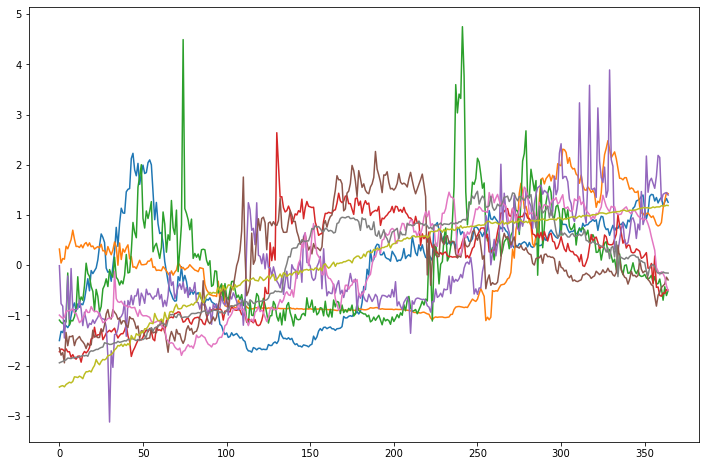

In [32]:
plt.figure(figsize=(12,8))
plt.plot(df_isol[df_isol.anomaly==-1].drop('anomaly', axis=1).T)
plt.show()

Данные, определённые Isolation Forest, как не аномальные

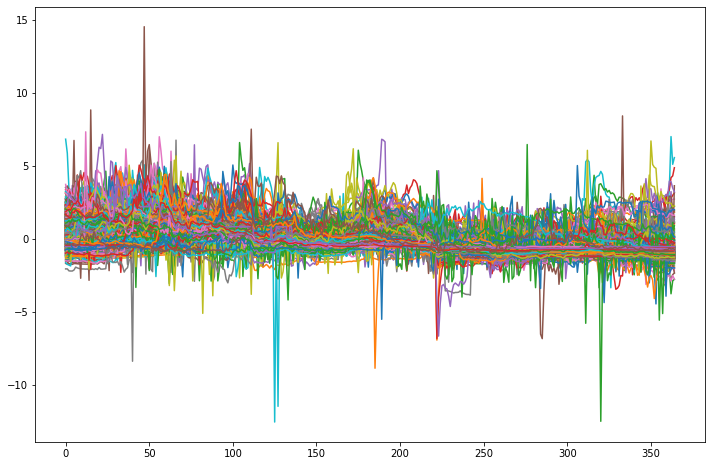

In [33]:
plt.figure(figsize=(12,8))
plt.plot(df_isol[df_isol.anomaly==1].drop('anomaly', axis=1).T)
plt.show()

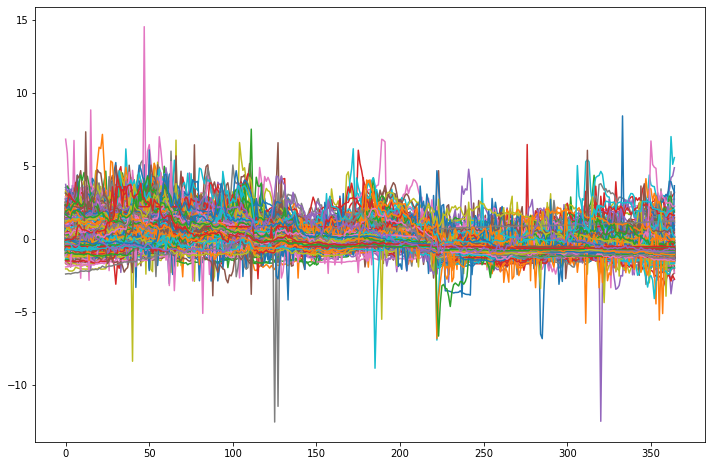

In [34]:
plt.figure(figsize=(12,8))
plt.plot(df_isol.drop('anomaly', axis=1).T)
plt.show()

In [35]:
df_isol[df_isol.anomaly==-1].shape

(9, 366)

Красивая картинка - исходных нормированных данных

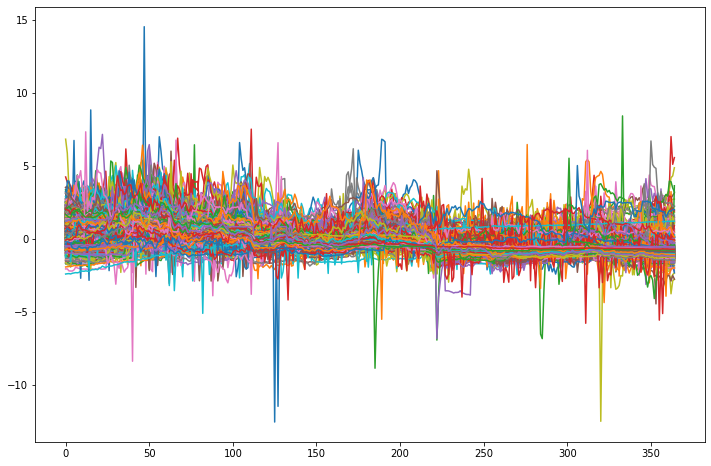

In [ ]:
plt.figure(figsize=(12,8))
plt.plot(tickers_scaled.T)
plt.show()

In [37]:
cleaned_df = tdf_crypto.loc[(tdf_crypto['thold1']==1)&(tdf_crypto['anomaly']==1)].drop(['anomaly','thold1'], axis=1)
anomaly_df = tdf_crypto.loc[(tdf_crypto['thold1']==-1)|(tdf_crypto['anomaly']==-1)].drop(['anomaly','thold1'], axis=1)

In [56]:
cleaned_df_ri = tdf_crypto.reset_index(drop=True)
clean_id = cleaned_df_ri.loc[(cleaned_df_ri['thold1']==1)&(cleaned_df_ri['anomaly']==1)].index
anomaly_df_ri = tdf_crypto.reset_index(drop=True)
anomaly_id = anomaly_df_ri.loc[(anomaly_df_ri['thold1']==-1)|(anomaly_df_ri['anomaly']==-1)].index

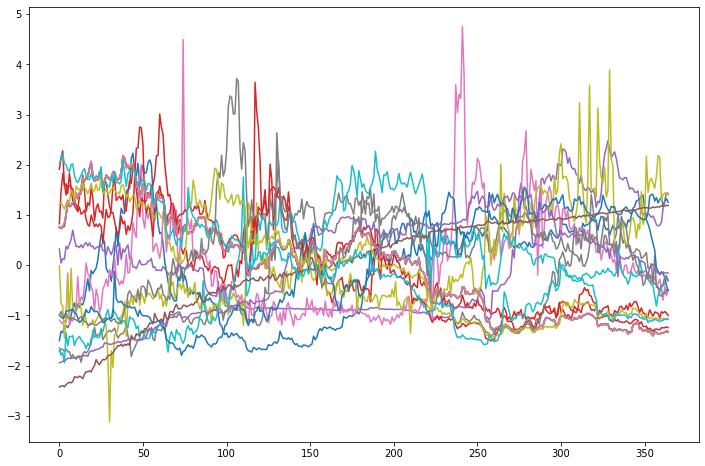

In [59]:
plt.figure(figsize=(12,8))
plt.plot(tickers_scaled[anomaly_id].T)
plt.show()

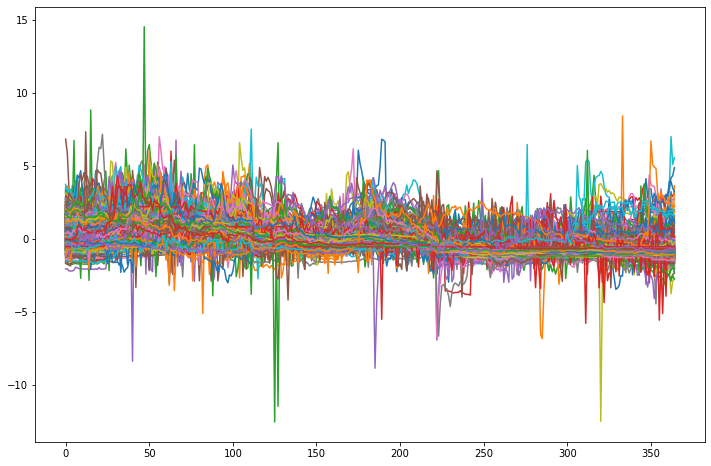

In [60]:
plt.figure(figsize=(12,8))
plt.plot(tickers_scaled[clean_id].T)
plt.show()

Basik KMeans

  0%|          | 0/19 [00:00<?, ?it/s]

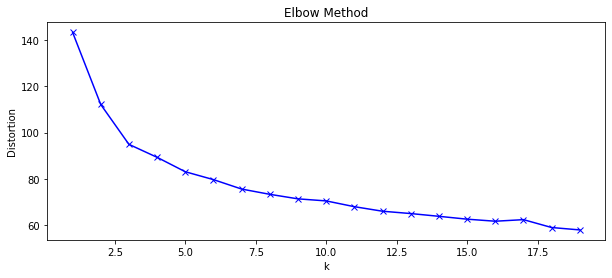

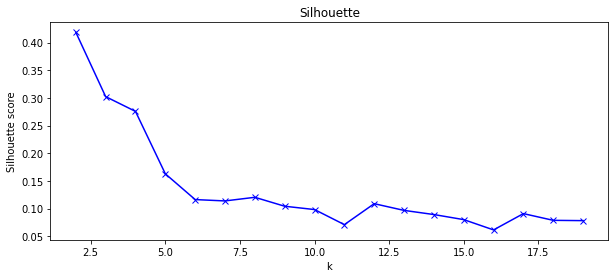

In [ ]:
distortions = []
silhouette = []
K = range(1, 20)
for k in tqdm(K):
    kmeanModel = TimeSeriesKMeans(n_clusters=k, metric="euclidean", n_jobs=6, max_iter=10)
    kmeanModel.fit(tickers_scaled)
    distortions.append(kmeanModel.inertia_)
    if k > 1:
        silhouette.append(silhouette_score(tickers_scaled, kmeanModel.labels_))
    
kl = KneeLocator(
    range(1, 20), distortions, curve="convex", direction="decreasing"
    )
plt.figure(figsize=(10,4))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('Elbow Method')
plt.show()

plt.figure(figsize=(10,4))
plt.plot(K[1:], silhouette, 'bx-')
plt.xlabel('k')
plt.ylabel('Silhouette score')
plt.title('Silhouette')
plt.show()

In [ ]:
kl.elbow

5

DTW

  0%|          | 0/3 [00:00<?, ?it/s]

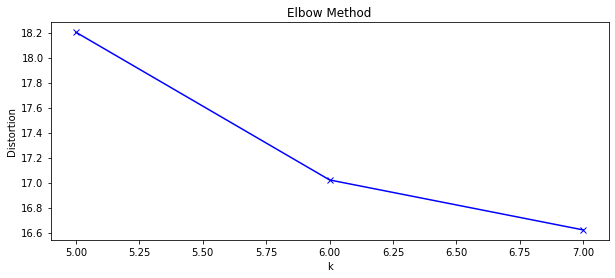

ValueError: ignored

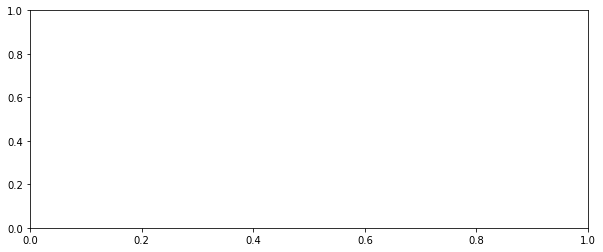

In [62]:
distortions = []
silhouette = []
K = range(5, 8)
for k in tqdm(K):
    kmeanModel = TimeSeriesKMeans(n_clusters=k, metric="dtw", n_jobs=6, max_iter=10)
    kmeanModel.fit(tickers_scaled[clean_id])
    distortions.append(kmeanModel.inertia_)
    if k > 1:
        silhouette.append(silhouette_score(tickers_scaled[clean_id], kmeanModel.labels_))


plt.figure(figsize=(10,4))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('Elbow Method')
plt.show()

plt.figure(figsize=(10,4))
plt.plot(K[1:], silhouette, 'bx-')
plt.xlabel('k')
plt.ylabel('Silhouette score')
plt.title('Silhouette')
plt.show()

In [63]:
kl = KneeLocator(
    range(5, 8), distortions, curve="convex", direction="decreasing"
    )

In [67]:
kl.elbow

None


In [78]:
n_clusters = 6 #по графику решить
ts_kmeans_dtw = TimeSeriesKMeans(n_clusters=n_clusters, metric="dtw", n_jobs=6, max_iter=10)
ts_kmeans_dtw.fit(tickers_scaled[clean_id])

TimeSeriesKMeans(max_iter=10, metric='dtw', n_clusters=6, n_jobs=6)

In [ ]:
plt.figure(figsize=(12,8))
for cluster_number in range(n_clusters):
    plt.plot(ts_kmeans_dtw.cluster_centers_[cluster_number, :, 0].T, label=cluster_number)
plt.title("Cluster centroids")

plt.legend()
plt.show()

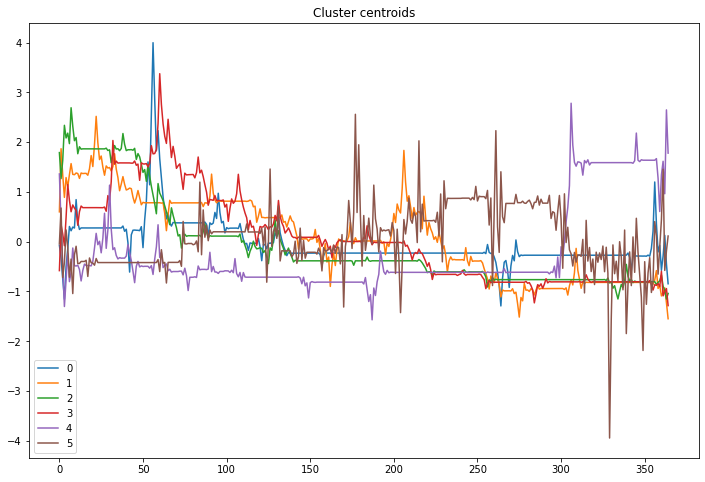

In [80]:
plt.figure(figsize=(12,8))
for cluster_number in range(n_clusters):
    plt.plot(ts_kmeans_dtw.cluster_centers_[cluster_number, :, 0].T, label=cluster_number)
plt.title("Cluster centroids")

plt.legend()
plt.show()

Центориды без очистки от аномалий

![picture](https://cdn.discordapp.com/attachments/1040337114233049120/1040389766740455424/image.png)

In [86]:
tdf_clean = tdf_crypto.iloc[clean_id]

In [87]:
tdf_clean['cluster'] = ts_kmeans_dtw.predict(tickers_scaled[clean_id])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [96]:
ts_kmeans_dtw.to_pickle('ts.pkl')

In [109]:
 def plot_cluster_tickers(current_cluster):
    fig, ax = plt.subplots(
        int(np.ceil(current_cluster.shape[0]/4)),
        4,
        figsize=(15, 3*int(np.ceil(current_cluster.shape[0]/4)))
    )
    fig.autofmt_xdate(rotation=45)
    ax = ax.reshape(-1)

    for index, (_, row) in enumerate(current_cluster.iterrows()):
        ax[index].plot(row.iloc[0:-2])
        ax[index].set_title(f"{_}")
        # plt.xticks(rotation=45)

    plt.tight_layout()
    plt.show()

                          Cluster number: 0


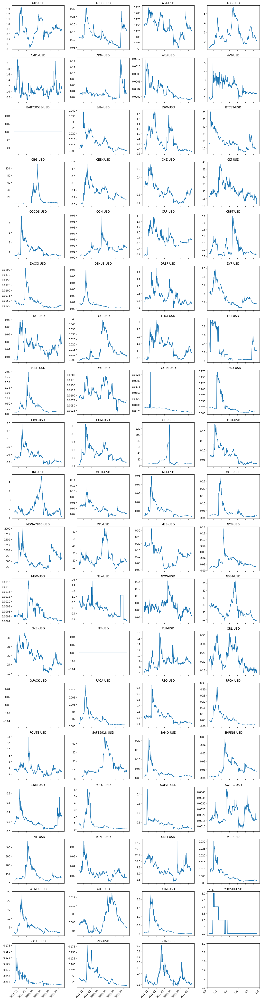

                          Cluster number: 1


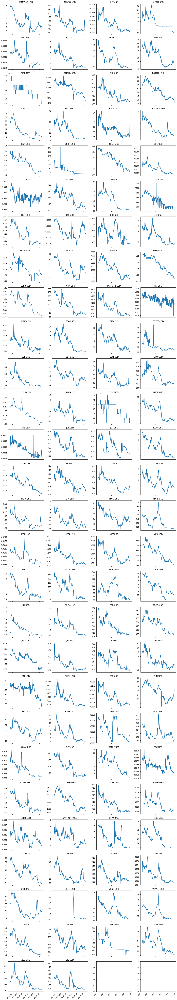

                          Cluster number: 2


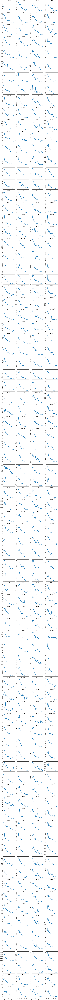

                          Cluster number: 3


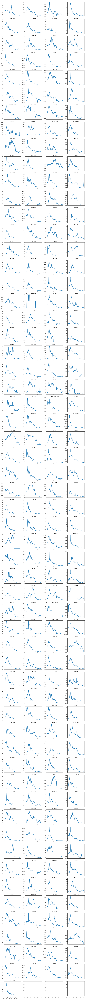

                          Cluster number: 4


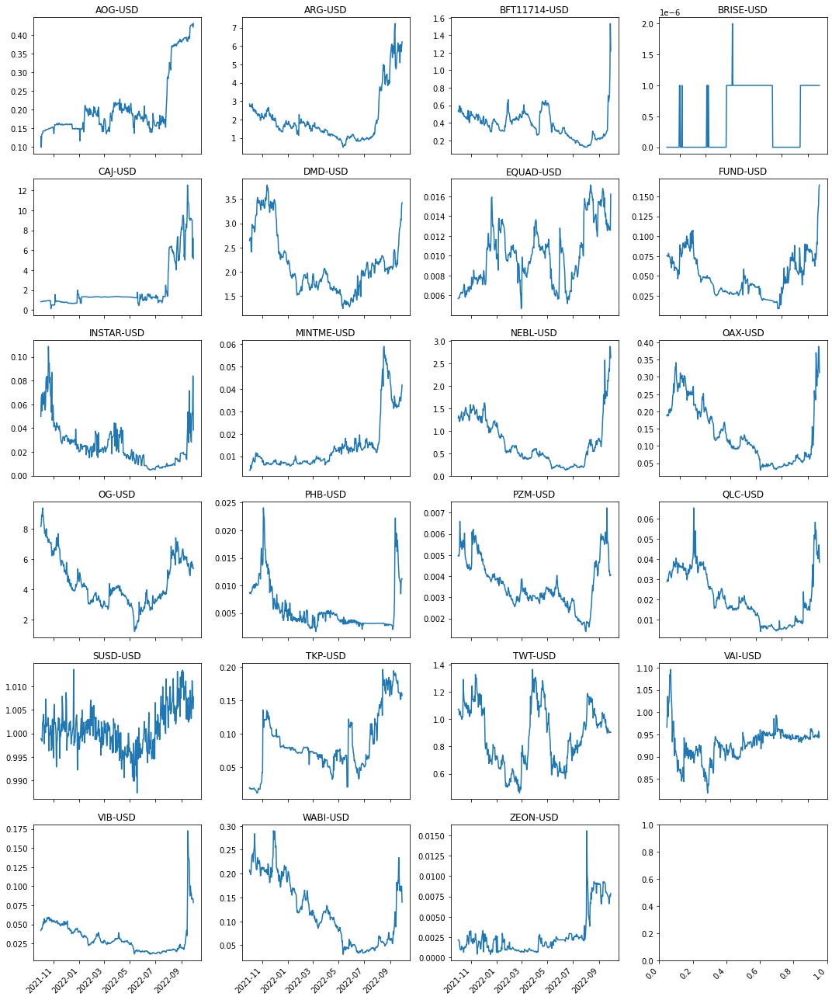

                          Cluster number: 5


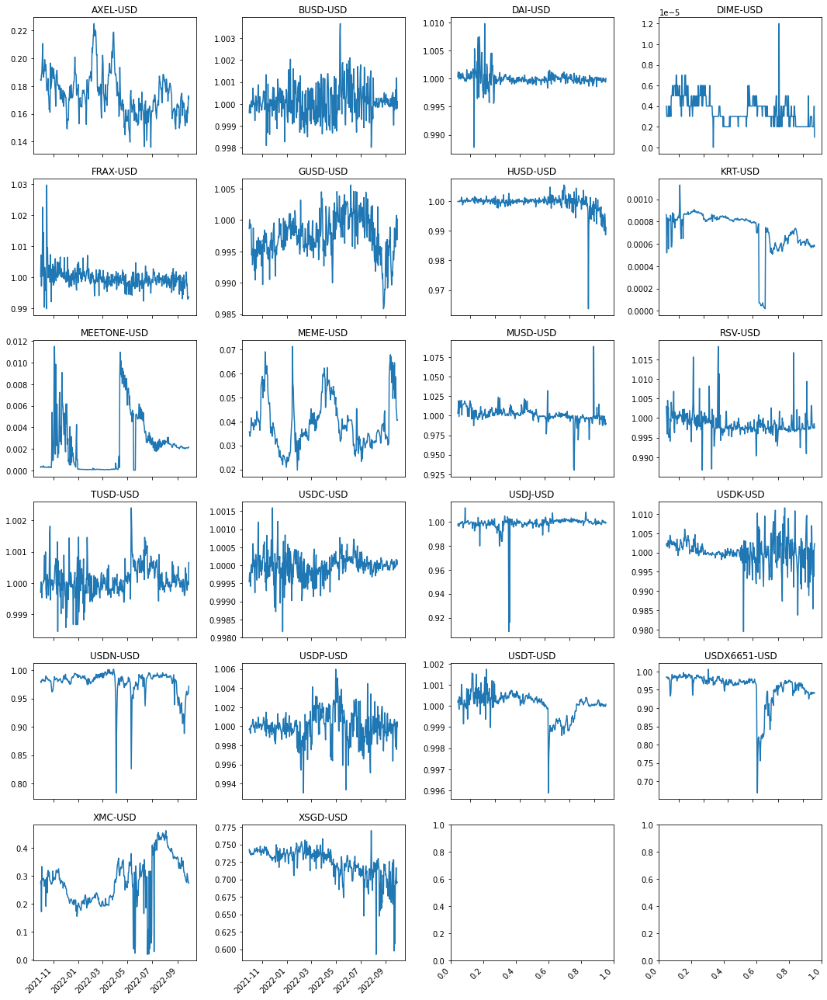

In [111]:
for cluster in range(n_clusters):
    print("=================================================================================")
    print(f"                          Cluster number: {cluster}")
    print("=================================================================================")
    plot_cluster_tickers(tdf_clean.drop(['thold1','anomaly'], axis=1)[tdf_clean.cluster==cluster])